# Gross approximations of protein structures using contact maps

<table align=left width='100%'>
    <tr><td width='200px,%'>Model</td><td><strong>Asymmetrical Conditional Prior VAE</strong></td><td>ACPVAE</td></tr>
    <tr><td width='200px,%'>Input data</td><td>sequence of amino-acids [0,1]</td><td>one-hot encoded</td></tr>
    <tr><td width='200px,%'>Output data</td><td>contact maps (n channels)</td><td>SoftMax [0, 1]</td></tr>
    <tr><td width='200px,%'>Injections</td><td>protein-level features (labels)</td><td>R continuous</td></tr>
    <tr><td width='200px,%'>Loss</td><td>Custom KL-Loss function on X and prior</td></tr>
</table>


In [31]:
date = '20250502'

import pickle as pkl
import math
from scipy.spatial.distance import cdist
import time
import numpy as np
import matplotlib.pyplot as plt
import importlib, sys, os
from scipy.signal import find_peaks

import torch
import torch.nn.functional as F

import random
random.seed(42)

# Import Data

In [32]:
parent_folder = "nanos_networkx_small"
folders = [name for name in os.listdir(parent_folder) 
           if os.path.isdir(os.path.join(parent_folder, name))]

print(len(folders))

1652


In [33]:
cwd = os.getcwd()
print(cwd)

/Users/laurofoletti/Documents/AML/P00_proteins/openmm


# Protein class definition

In [34]:
if 'classes.proteins' in sys.modules: importlib.reload(sys.modules['classes.proteins'])
from classes.proteins import *

# Protein collections

In [35]:
random.seed(42)

PROTEINS = Protein_Collection()
SUBPROTEINS = Protein_Collection()

chunk_length = 50

for folder in folders[:500]:
    filename = f"{cwd}/{parent_folder}/{folder}/{folder}{folder[-2:]}_atoms.pkl"
    with open(filename, 'rb') as f:
        try:
            data = pkl.load(f)
            protein = Protein(data)
            PROTEINS.append(protein)
        except Exception as e:
            print (folder, 'corrupted')

PROTEINS.randomize

print (f"{PROTEINS.len} proteins")

for source_i, protein in enumerate(PROTEINS):
    aas, cas = protein.explode(chunk_length)
    for i in range(len(aas)):
        subprotein = Protein(aas=aas[i], cas=cas[i], source_idx=source_i)
        SUBPROTEINS.append(subprotein)

SUBPROTEINS.randomize

print (f"{SUBPROTEINS.len} subsequences")

SUBPROTEINS = SUBPROTEINS[:5000]
print (f"{SUBPROTEINS.len} items in database")

8SFS_nanobody_C corrupted
7VND_nanobody_D corrupted
498 proteins
62589 subsequences
5000 items in database


In [36]:
protein = PROTEINS[0]
print (protein.fasta)
print (protein.charge)
print (protein.hydrophobicity_score)
print (protein.cysteine_fraction)
print (protein.isoelectric_point)

QVQLVESGGGLVQAGGSLRLSCAASGSIFSINAMGWYRQAPGKQRELVAAITRGGRTNYADSVKGRFTLSRDNAKNTVYLQMNSLKPEDTAVYYCNVGRSRGYWGQGTQVTVSS
6.914076935054265
-0.3605263157894736
0.017543859649122806
9.85697422027588


# Contact maps definition and reconstruction test

Limits [2.410465698330527, 8.893037127541547, 12.786305241378857, 16.307497825760198, 20.09405777172722, 25.07489164298404, 41.65138292878639]
All distances 12250000


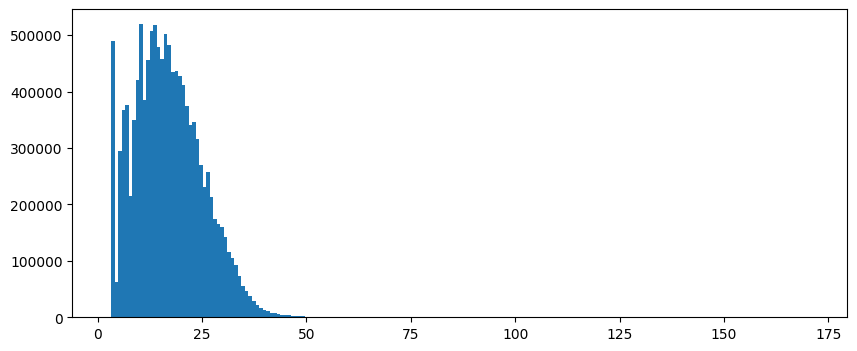

In [37]:
def get_Configs(all_distances=None, n_ranges=4, mode='percentile'):

    if mode == 'percentile':
        # even distribution of contacts within the ranges, i suppose it will make the training better
        limits = np.percentile(all_distances, [100*i/n_ranges for i in range(n_ranges)] + [99.6]).tolist()

    elif mode == 'distance':
        # even distance ranges
        min_d, max_d = all_distances.min(), all_distances.max()
        std, mean = all_distances.std(), all_distances.mean()
        min_std, max_std = mean-2*std, mean+2*std
        limits = [min_std + i*((max_std-min_std)/n_ranges) for i in range(n_ranges)] + [max_d]
        limits[0] = min_d

    else:
        print ("Define config mode, mode in ['percentile', 'distances']")
        return False
        
    print ('Limits', limits)
    print ('All distances', len(all_distances))

    CONFIGS = []
    for i in range(len(limits)-1):
        CONFIGS.append({'lower':limits[i], 'upper':limits[i+1]})
        
    return CONFIGS

all_distances = [protein.D for protein in SUBPROTEINS]
all_distances = np.array(all_distances)
all_distances = all_distances[all_distances != 0.]

CONFIGS = get_Configs(all_distances, n_ranges=6, mode='percentile')

plt.figure(figsize=(10,4))
plt.hist(all_distances, bins=200)
_ = plt.show()

Limits [2.410465698330527, 8.893037127541547, 12.786305241378857, 16.307497825760198, 20.09405777172722, 25.07489164298404, 41.65138292878639]
All distances 12250000


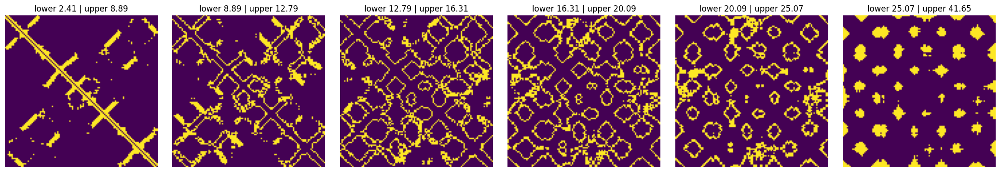

In [38]:
if 'functions.misc' in sys.modules: importlib.reload(sys.modules['functions.misc'])
from functions.misc import *

protein = PROTEINS[0]

CONFIGS = get_Configs(all_distances, n_ranges=6, mode='percentile')
cmaps = [protein.add_contact_map(config['lower'], config['upper'], False) for config in CONFIGS]
titles = [f"lower {round(config['lower'],2)} | upper {round(config['upper'],2)}" for config in CONFIGS]
compare_images(cmaps, titles, masking=False)

In [27]:
if 'functions.misc' in sys.modules: importlib.reload(sys.modules['functions.misc'])
from functions.misc import *

orig_cmap_recon_coords = reconstruct_coords_local_plural_maps(cmaps, CONFIGS, sharpness=15., window=25, 
                                                              dim=3, lr=1e-2, max_iter=5000, prints=10)

Gradient-based optimization with multiple contact maps...
Step       0 | total loss:    83.65 (['    3.91', '    7.19', '    7.29', '    9.05', '   13.24', '   38.94'])
Step     500 | total loss:    32.29 (['    2.64', '    4.66', '    4.96', '    4.94', '    5.63', '    9.01'])
Step    1000 | total loss:    20.44 (['    2.05', '    3.29', '    3.57', '    3.79', '    3.94', '    3.37'])
Step    1500 | total loss:     6.56 (['    0.65', '    1.01', '    1.14', '    1.29', '    1.28', '    0.95'])
Step    2000 | total loss:     1.67 (['    0.16', '    0.25', '    0.30', '    0.35', '    0.29', '    0.23'])
Step    2500 | total loss:     0.34 (['    0.01', '    0.05', '    0.08', '    0.08', '    0.06', '    0.03'])
Step    3000 | total loss:     0.06 (['    0.00', '    0.01', '    0.01', '    0.02', '    0.01', '    0.00'])
Step    3500 | total loss:     0.03 (['    0.00', '    0.00', '    0.01', '    0.01', '    0.01', '    0.00'])
Step    4000 | total loss:     0.03 (['    0.00', '   

In [10]:
if 'functions.graphics' in sys.modules: importlib.reload(sys.modules['functions.graphics'])
from functions.graphics import *

plotly_2_graphs([np.array(protein.ca), orig_cmap_recon_coords], 'Reconstruction test from true contact maps')

In [39]:
if 'functions.misc' in sys.modules: importlib.reload(sys.modules['functions.misc'])
from functions.misc import *

for protein in PROTEINS:
    for config in CONFIGS:
        protein.add_contact_map(config['lower'], config['upper'], True)
    
for protein in SUBPROTEINS:
    for config in CONFIGS:
        protein.add_contact_map(config['lower'], config['upper'], True)

# Statistical lookup

In [40]:
# some useful stats

UNIQUE_AA = set()
for protein in PROTEINS:
    UNIQUE_AA.update(protein.aa)
UNIQUE_AA.update(['NUL'])
print(f"Unique amino acids in database : {len(UNIQUE_AA)}")

MAX_LEN = max([protein.len for protein in SUBPROTEINS])
print(f"Max protein length :             {MAX_LEN}")

def transform_in(data, MIN, MAX):
    transformed = (data - MIN) / ((MAX - MIN) + 1e-6)
    return transformed

def transform_out(data, MIN, MAX):
    transformed = (data * ((MAX - MIN) + 1e-6)) + MIN
    return transformed

Unique amino acids in database : 22
Max protein length :             50


# Training data

In [45]:
AA_TRAINING_DATA = torch.stack([torch.tensor(protein.get_oh(list(UNIQUE_AA)), dtype=torch.float32) for protein in SUBPROTEINS])

CONTACT_TRAINING_DATA = torch.stack([torch.tensor(np.stack(protein.contact_maps, axis=-1), dtype=torch.float32) for protein in SUBPROTEINS])

FEAT_1 = torch.tensor([PROTEINS[subprotein.source_idx].hydrophobicity_score for subprotein in SUBPROTEINS], dtype=torch.float32).unsqueeze(-1)
FEAT_2 = torch.tensor([PROTEINS[subprotein.source_idx].charge for subprotein in SUBPROTEINS], dtype=torch.float32).unsqueeze(-1)
FEAT_3 = torch.tensor([PROTEINS[subprotein.source_idx].cysteine_fraction for subprotein in SUBPROTEINS], dtype=torch.float32).unsqueeze(-1)
FEAT_4 = torch.tensor([PROTEINS[subprotein.source_idx].isoelectric_point for subprotein in SUBPROTEINS], dtype=torch.float32).unsqueeze(-1)
LABEL_DATA = torch.concat((FEAT_1, FEAT_2, FEAT_3, FEAT_4), axis=-1)

print ('Training data              ', AA_TRAINING_DATA.shape)
print ('contact maps training data ', CONTACT_TRAINING_DATA.shape)
print ('Label training data        ', LABEL_DATA.shape)

Training data               torch.Size([5000, 50, 22])
contact maps training data  torch.Size([5000, 50, 50, 6])
Label training data         torch.Size([5000, 4])


In [46]:
if 'functions.customDataset' in sys.modules: importlib.reload(sys.modules['functions.customDataset'])
from functions.customDataset import *
    
BATCH_SIZE = 32

TRAIN_TEST_in =    split_train_test(AA_TRAINING_DATA, SUBPROTEINS)
TRAIN_TEST_out =   split_train_test(CONTACT_TRAINING_DATA, SUBPROTEINS)
TRAIN_TEST_lab =   split_train_test(LABEL_DATA, SUBPROTEINS)
DATALOADERS =      [(get_dataloader(TRAIN_TEST_in[0], TRAIN_TEST_out[0], TRAIN_TEST_lab[0], BATCH_SIZE), 
                     get_dataloader(TRAIN_TEST_in[1], TRAIN_TEST_out[1], TRAIN_TEST_lab[1], BATCH_SIZE))]

print (len(DATALOADERS), len(DATALOADERS[0]))

1 2


# Model definition and training classes

In [47]:
if 'classes.Asymmetrical_Conditional_Prior_VAE' in sys.modules: importlib.reload(sys.modules['classes.Asymmetrical_Conditional_Prior_VAE'])
if 'functions.ACPVAE_training' in sys.modules: importlib.reload(sys.modules['functions.ACPVAE_training'])

from classes.Asymmetrical_Conditional_Prior_VAE import *
from functions.ACPVAE_training import *

# Hyperparameters and Training

In [48]:
code_size =     128
input_size =    TRAIN_TEST_in[0].shape[-1]
hidden_size =   128
output_size =   TRAIN_TEST_out[0].shape[-1]
label_size =    LABEL_DATA.shape[-1]
channels =      len(CONFIGS)
epochs =        1500
lr =            1e-5
kl_sigma =      1e-5

print ('input_size ', input_size)
print ('output_size', output_size)
print ('')

input_size  1100
output_size 15000



In [49]:
Training_pool = []

for i in range(len(DATALOADERS)):
    
    model = XYCPVAE(input_size=input_size, hidden_size=hidden_size, label_size=label_size, 
                  code_size=code_size, output_size=output_size, channels=channels)
    optimizer = torch.optim.RMSprop(model.parameters(), lr=lr, alpha=0.99, momentum=0.9)
    model.apply(model.weights_init)
    
    Trainer = Training(name=f'XY-CPVAE {i}', model=model, optimizer=optimizer, with_kl=True)
    Training_pool.append(Trainer)

print (f'Training pool : about to train {len(Training_pool )} different models, this may require some time ...')

Training pool : about to train 1 different models, this may require some time ...


In [50]:
for i, dataloaders in enumerate(DATALOADERS):
    
    train_dl, test_dl = dataloaders
    Trainer = Training_pool[i]
    Trainer.train(train_dl, test_dl, kl_sig=kl_sigma, loss_type='MSE', epochs=1500, prints=100, verbose=False, loss_enlarge=1.)

    with open(f'models/{date}_trainer_{i}.pkl', 'wb') as f:
        pkl.dump(Trainer, f)

Training on device: cpu
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Training model XY-CPVAE 0
4500 training samples, 500 test samples, 1500 epochs
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Epoch [     1/1500] Train KL-L:       309.57 | Train RECON-L:      2134.80 | Test KL-L:       191.01 | Test RECON-L:      2106.80


KeyboardInterrupt: 

# Evaluation

In [20]:
Training_pool = []
for i in range(len(CONFIGS)):
    try:
        with open(f'models/{date}_trainer_{i}.pkl', 'rb') as f:
            Training_pool.append(pkl.load(f))
    except:
        continue

In [61]:
if 'functions.misc' in sys.modules: importlib.reload(sys.modules['functions.misc'])
from functions.misc import *

[trainer.model.eval() for trainer in Training_pool]

loss_fn = torch.nn.MSELoss(reduction='sum')

def Recon(Trainer, sample_orig, sample_y, label):
    
    x = sample_orig
    y = sample_y
            
    mu, logvar = Trainer.model.encode(x, label)
    z = Trainer.model.reparameterize(mu, logvar)
    out = Trainer.model.decode(z, label)
            
    loss = loss_fn(out, y)
    score = loss.item()
    Dist_m = out.detach()    
        
    return (Dist_m, score)
    
def get_DB(idx):

    DB_SUB = Protein_Collection()

    folder = folders[idx]
    filename = f"{cwd}/{parent_folder}/{folder}/{folder}{folder[-2:]}_atoms.pkl"
    with open(filename, 'rb') as f:
        data = pkl.load(f)
        
    protein = Protein(data)
        
    aas, cas = protein.explode(chunk_length)
    for i in range(len(aas)):
        subprotein = Protein(aas=aas[i], cas=cas[i])
        for config in CONFIGS:
            subprotein.add_contact_map(config['lower'], config['upper'], True)
        DB_SUB.append(subprotein)
    
    print (f"Original protein length", protein.len)
    print (f"{DB_SUB.len} subsequences")
    
    return (protein, DB_SUB)

def get_training_sets(protein, data, idx=0):

    AA_train = torch.stack([torch.tensor(protein.get_oh(list(UNIQUE_AA)), dtype=torch.float32) for protein in data])
    CM_train = torch.stack([torch.tensor(np.stack(protein.contact_maps, axis=-1), dtype=torch.float32) for protein in data])
    FEAT_1 = torch.tensor([protein.hydrophobicity_score for subprotein  in data], dtype=torch.float32).unsqueeze(-1)
    FEAT_2 = torch.tensor([protein.charge for subprotein in data], dtype=torch.float32).unsqueeze(-1)
    FEAT_3 = torch.tensor([protein.cysteine_fraction for subprotein in data], dtype=torch.float32).unsqueeze(-1)
    FEAT_4 = torch.tensor([protein.isoelectric_point for subprotein in data], dtype=torch.float32).unsqueeze(-1)
    LABEL_train = torch.concat((FEAT_1, FEAT_2, FEAT_3, FEAT_4), axis=-1)

    TRAIN_x =    AA_train
    TRAIN_out =  CM_train
    TRAIN_label = LABEL_train
    TRAIN_x =    TRAIN_x.view(TRAIN_x.size(0),-1)
    TRAIN_out =  TRAIN_out.view(TRAIN_out.size(0),-1)
    
    return (TRAIN_x, TRAIN_out, LABEL_train)

def get_protein_average_contact(Dist_m, protein):

    protein_DM = np.zeros((protein.len, protein.len))
    divider_DM =  np.zeros((protein.len, protein.len))
    hard_mask = np.zeros((protein.len, protein.len)).astype(bool)
    
    for i in range(chunk_length):
        Dist_matrix = Dist_m[i].view(chunk_length,chunk_length).detach().numpy()
        
        protein_DM[-chunk_length+i:,-chunk_length+i:] += Dist_matrix[:chunk_length-i,:chunk_length-i]
        divider_DM[-chunk_length+i:,-chunk_length+i:] += 1.
        hard_mask[-chunk_length+i:,-chunk_length+i:] = 1
        
        if i > 0:
            protein_DM[:i,:i] += Dist_matrix[-i:,-i:]
            divider_DM[:i,:i] += 1.
            hard_mask[:i,:i] = 1

            protein_DM[-chunk_length+i:,:i] += Dist_matrix[:chunk_length-i,-i:]
            divider_DM[-chunk_length+i:,:i] += 1.
            hard_mask[-chunk_length+i:,:i] = 1

            protein_DM[:i, -chunk_length+i:] += Dist_matrix[-i:,:chunk_length-i]
            divider_DM[:i, -chunk_length+i:] += 1.
            hard_mask[:i, -chunk_length+i:] = 1
        
    for i in range(chunk_length, len(Dist_m)):
        Dist_matrix = Dist_m[i].view(chunk_length,chunk_length).detach().numpy()
        protein_DM[i-chunk_length:i, i-chunk_length:i] += Dist_matrix
        divider_DM[i-chunk_length:i, i-chunk_length:i] += 1.
        hard_mask[i-chunk_length:i, i-chunk_length:i] = 1
    
    divider_DM[divider_DM == 0.] = 1.
    protein_DM /= divider_DM

    return (protein_DM, hard_mask)

Original protein length 125
125 subsequences
torch.Size([125, 15000])
torch.Size([125, 50, 50, 6])


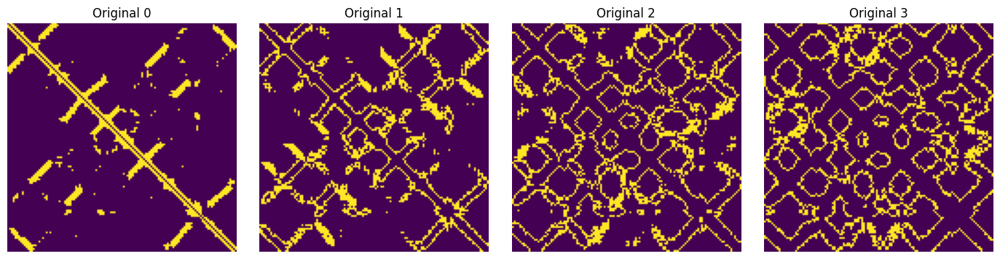

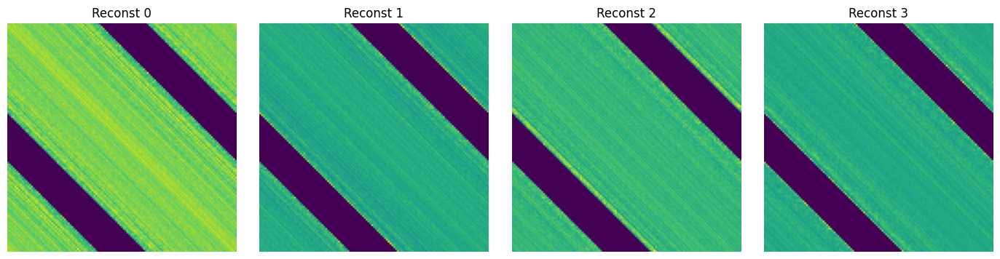

In [62]:
results = []
trainer = Training_pool[0]

for idx in [0]:
    
    protein, DB_SUB = get_DB(idx)
    original_cmaps = [protein.add_contact_map(config['lower'], config['upper'], False) for config in CONFIGS]
    
    TRAIN_x, TRAIN_out, TRAIN_label = get_training_sets(protein, DB_SUB)
    Contact_map, scores = Recon(trainer, TRAIN_x, TRAIN_out, TRAIN_label)
    print (Contact_map.shape)
    Contact_map = Contact_map.reshape(Contact_map.shape[0], chunk_length, chunk_length, len(CONFIGS))
    print (Contact_map.shape)
    
    recon_cmaps, hard_masks = [], []
    for i in range(len(CONFIGS)):
        recon_average_contact, hard_mask = get_protein_average_contact(Contact_map[:,:,:,i].squeeze(), protein)
        recon_cmaps.append(recon_average_contact)
        hard_masks.append(hard_mask)

    item = {'protein': protein, 'original_cmaps': original_cmaps, 'recon_cmaps': recon_cmaps, 'hard_masks': hard_masks} 
    results.append(item)

compare_images(results[0]['original_cmaps'][:4], [f'Original {i}' for i in range(4)], masking=False, masks=results[0]['hard_masks'])
compare_images(results[0]['recon_cmaps'][:4], [f'Reconst {i}' for i in range(4)], masking=False, masks=results[0]['hard_masks'])


# Reconstructions

In [63]:
def sharpen(x, temperature=0.01):
    x = np.array(x)
    e_x = np.exp(x / temperature)
    return e_x / np.sum(e_x, axis=-1, keepdims=True)
    
def symmetrize(contact_map):
    symmetrical = np.maximum(contact_map, contact_map.T)
    return symmetrical

def regularize(contact_maps, hard_masks):
    stacked = np.stack(contact_maps, axis=2)
    stacked_sharp = np.round(sharpen(stacked))
    regularized = [stacked_sharp[:,:,i] for i in range(len(contact_maps))]
    [np.fill_diagonal(arr, 0) for arr in regularized]
    return regularized

def getMasked(cmap, mask):
    temp = cmap.copy()
    temp[~mask] = 0.
    return temp

In [64]:
importlib.reload(sys.modules['functions.misc'])
from functions.misc import *

known_mask = hard_masks[0].copy()
#np.fill_diagonal(known_mask, False)

original_contact_maps = results[0]['original_cmaps']
orig_masked = [getMasked(cmap, known_mask) for cmap in original_contact_maps]
orig_cmap_recon_coords_masked = reconstruct_coords_local_plural_maps(orig_masked.copy(), 
                                                              CONFIGS, hard_mask=known_mask, sharpness=15.,
                                                              window=25, dim=3, lr=1e-2, max_iter=7000, prints=10)

recon_contact_maps = results[0]['recon_cmaps']
recon_contact_maps = [symmetrize(contact_map) for contact_map in recon_contact_maps]
recon_contact_maps = regularize(recon_contact_maps, known_mask)
#range_matrix = fill_missing(get_range_matrix(recon_contact_maps, known_mask, CONFIGS), known_mask, CONFIGS)
#filled_recon_cmaps = get_cmaps_from_range_matrix(range_matrix, CONFIGS)

recon_cmap_recon_coords = reconstruct_coords_local_plural_maps(recon_contact_maps, 
                                                               CONFIGS, hard_mask=known_mask, sharpness=15.,
                                                               window=25, dim=3, lr=1e-2, max_iter=7000, prints=10)


Gradient-based optimization with multiple contact maps...
Step       0 | total loss:   243.26 (['    6.36', '   23.77', '   20.99', '   30.01', '   53.72', '  101.92'])
Step     700 | total loss:    66.18 (['    3.66', '   11.34', '   10.31', '    9.53', '   13.70', '   17.47'])
Step    1400 | total loss:    14.69 (['    1.16', '    2.53', '    2.63', '    1.99', '    2.62', '    3.71'])
Step    2100 | total loss:     5.15 (['    0.43', '    0.52', '    0.62', '    0.70', '    0.83', '    2.02'])
Step    2800 | total loss:     4.74 (['    0.42', '    0.45', '    0.53', '    0.61', '    0.81', '    1.89'])
Step    3500 | total loss:     4.71 (['    0.42', '    0.45', '    0.52', '    0.60', '    0.81', '    1.88'])
Step    4200 | total loss:     4.71 (['    0.42', '    0.45', '    0.52', '    0.60', '    0.81', '    1.88'])
Step    4900 | total loss:     4.71 (['    0.42', '    0.45', '    0.52', '    0.60', '    0.81', '    1.88'])
Step    5600 | total loss:     4.71 (['    0.42', '   

KeyboardInterrupt: 

In [ ]:
with open('test_coords.pkl', 'wb') as f:
    data = {'recon': recon_cmap_recon_coords, 'orig': orig_cmap_recon_coords}
    pkl.dump(data, f)

In [ ]:
if 'functions.graphics' in sys.modules: importlib.reload(sys.modules['functions.graphics'])

from functions.graphics import *

plotly_2_graphs([np.array(results[0]['protein'].ca), orig_cmap_recon_coords_masked], 'Reconstruction from true contact maps')
plotly_2_graphs([np.array(results[0]['protein'].ca), recon_cmap_recon_coords], 'Reconstruction from reconstructed contact map')